#$$
 \textbf{Projects in Machine Learning (ML) and Artificial Intelligence (AI)}
$$

# $$
 \textbf{CSCI 6967}
 $$

# $$
 \textbf{Homework 5}
 $$

#**Task 2**

##Part 1 (7 points): Variational Autoencoder (VAE): Here is a complete implementation of a VAE in TensorFlow: https://www.tensorflow.org/tutorials/generative/cvae PyTorch implementation is fine too. Following these steps try generating images using the same encoder-decoder architecture using a different Image dataset (other than MNIST).

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18            │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_18 (Conv2D)        │ (None, 32, 32, 32)     │            896 │ input_layer_18[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_19 (Conv2D)        │ (None, 16, 16, 64)     │         18,496 │ conv2d_18[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_20 (Conv2D)        │ (None, 8, 8, 128)      │         73,856 │ conv2d_19[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_8 (Flatten)       │ (None, 8192)           │              0 │ conv2d_20[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 256)            │      2,097,408 │ flatten_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 16)             │          4,112 │ dense_16[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 16)             │          4,112 │ dense_16[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sampling_8 (Sampling)     │ (None, 16)             │              0 │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,198,880 (8.39 MB)

 Trainable params: 2,198,880 (8.39 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)          │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 8192)                │         139,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_8 (Reshape)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_26                  │ (None, 16, 16, 128)         │         147,584 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_27                  │ (None, 32, 32, 64)          │          73,792 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_28                  │ (None, 64, 64, 32)          │          18,464 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_29                  │ (None, 64, 64, 3)           │             867 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 379,971 (1.45 MB)

 Trainable params: 379,971 (1.45 MB)

 Non-trainable params: 0 (0.00 B)

Found 2188 files.
Epoch 1/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - kl_loss: 9.5846 - loss: 2732.6931 - reconstruction_loss: 2723.1084
Epoch 2/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - kl_loss: 7.0364 - loss: 2526.1409 - reconstruction_loss: 2519.1042
Epoch 3/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - kl_loss: 6.9822 - loss: 2502.9028 - reconstruction_loss: 2495.9204
Epoch 4/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - kl_loss: 7.0559 - loss: 2491.4802 - reconstruction_loss: 2484.4243
Epoch 5/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - kl_loss: 9.1512 - loss: 2471.1245 - reconstruction_loss: 2461.9731
Epoch 6/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - kl_loss: 10.0079 - loss: 2456.8462 - reconstruction_loss: 2446.8384
Epoch 7/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - kl_loss: 10.0886 - loss: 2445.6890 - reconstruction_loss: 2435.6003
Epoch 8/50
69/69 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - kl_loss: 10.0566 - loss: 2437.2913 - reconstruction_loss: 2427.2346
Epoch 9/5

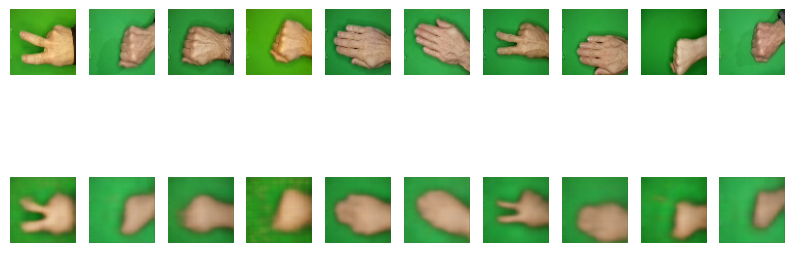

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


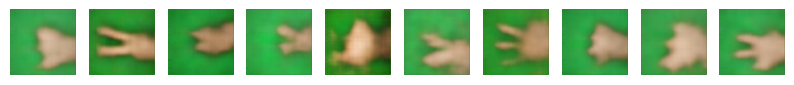

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# Hyperparameters
# -------------------------
latent_dim = 16
img_size = (64, 64)
epochs = 50
batch_size = 32

# -------------------------
# Sampling Layer
# -------------------------
class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# -------------------------
# Encoder
# -------------------------
encoder_inputs = layers.Input(shape=(img_size[0], img_size[1], 3))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)  # 32x32x32
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)              # 16x16x64
x = layers.Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)             # 8x8x128
x = layers.Flatten()(x)
x = layers.Dense(256, activation="relu")(x)  # More complexity to learn features
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# -------------------------
# Decoder
# -------------------------
latent_inputs = layers.Input(shape=(latent_dim,))
x = layers.Dense(8 * 8 * 128, activation="relu")(latent_inputs)  # 8x8x128
x = layers.Reshape((8, 8, 128))(x)
x = layers.Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)  # 16x16x128
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)   # 32x32x64
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)   # 64x64x32
decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)  # 64x64x3

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

# -------------------------
# Custom VAE Model
# -------------------------
class VAE(tf.keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]  # Ignore labels if present

        data = tf.cast(data, tf.float32)  # Ensure the input is float32
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data, training=True)
            reconstruction = self.decoder(z, training=True)

            # Compute reconstruction loss (pixel-wise)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    tf.keras.losses.binary_crossentropy(data, reconstruction),
                    axis=[1, 2]  # Remove last axis to handle different cases (grayscale or RGB)
                )
            )

            # KL Divergence loss
            kl_loss = -0.5 * tf.reduce_mean(
                tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
            )

            total_loss = reconstruction_loss + kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss
        }


vae = VAE(encoder, decoder)
vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))

# -------------------------
# Load Dataset
# -------------------------
dataset_path = '/content/drive/MyDrive/rps-cv-images'

train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    label_mode=None,
    image_size=img_size,
    batch_size=batch_size,
    color_mode='rgb',  # Ensure all images are 3-channel
    shuffle=True
)

# Normalize
train_dataset = train_dataset.map(lambda x: x / 255.0)

# -------------------------
# Train
# -------------------------
vae.fit(train_dataset, epochs=epochs)

# -------------------------
# Reconstruction (Check Quality)
# -------------------------
def plot_reconstruction(model, dataset):
    batch = next(iter(dataset))  # Get one batch
    original = batch[:10]  # Take 10 images
    z_mean, z_log_var, z = model.encoder(original)
    reconstructed = model.decoder(z)

    plt.figure(figsize=(10, 4))
    for i in range(10):
        # Original
        plt.subplot(2, 10, i + 1)
        plt.imshow(original[i])
        plt.axis("off")

        # Reconstructed
        plt.subplot(2, 10, i + 11)
        plt.imshow(reconstructed[i])
        plt.axis("off")

    plt.show()

plot_reconstruction(vae, train_dataset)

# -------------------------
# Generate New Images
# -------------------------
def generate_images(model, num_images=10):
    random_latents = np.random.normal(size=(num_images, latent_dim))
    generated_images = model.decoder.predict(random_latents)

    plt.figure(figsize=(10, 4))
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(generated_images[i])
        plt.axis("off")
    plt.show()

generate_images(vae)


##Part 2 (8 points): Generative Adversarial Networks (GANs): Repeat part 1 (use same dataset) and implement a GAN model to generate high quality synthetic images. You may follow steps outlined here: https://www.tensorflow.org/tutorials/generative/dcgan

Found 2188 files.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                     │ (None, 16384)               │       1,638,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 16384)               │          65,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_9 (Reshape)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_30                  │ (None, 16, 16, 128)         │         819,200 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_31                  │ (None, 32, 32, 64)          │         204,800 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_32                  │ (None, 64, 64, 3)           │           4,800 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,733,504 (10.43 MB)

 Trainable params: 2,700,352 (10.30 MB)

 Non-trainable params: 33,152 (129.50 KB)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)                   │ (None, 32, 32, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 16, 16, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 1)                   │          32,769 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 242,561 (947.50 KB)

 Trainable params: 242,561 (947.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1, Gen Loss: 3.1448, Disc Loss: 0.0601, Time: 19.57 sec


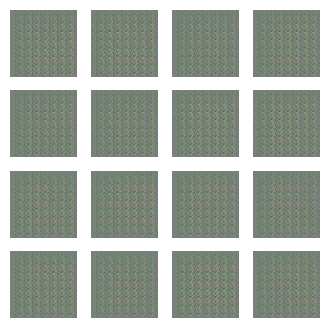

Epoch 2, Gen Loss: 4.2272, Disc Loss: 0.1458, Time: 1.89 sec


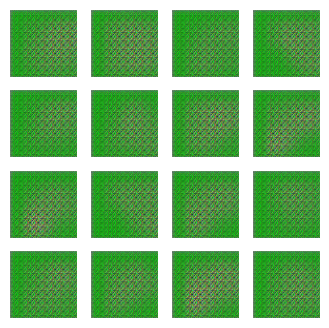

Epoch 3, Gen Loss: 3.1438, Disc Loss: 0.2309, Time: 1.90 sec


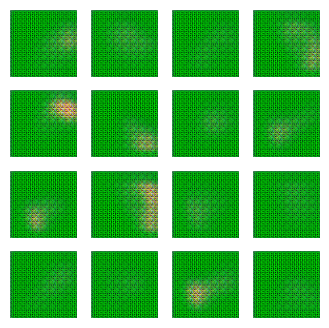

Epoch 4, Gen Loss: 3.4452, Disc Loss: 0.6129, Time: 1.91 sec


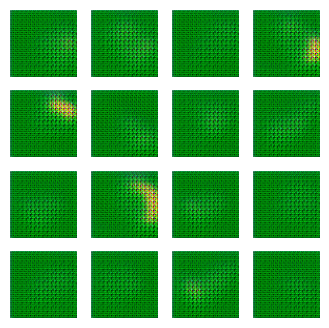

Epoch 5, Gen Loss: 2.8078, Disc Loss: 0.3691, Time: 1.92 sec


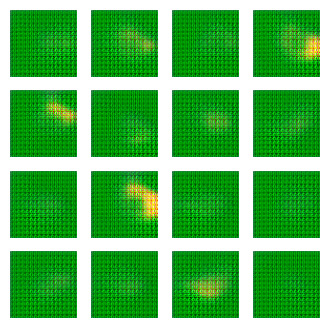

Epoch 6, Gen Loss: 3.4539, Disc Loss: 0.3350, Time: 1.94 sec


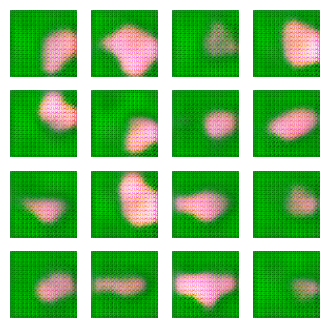

Epoch 7, Gen Loss: 3.4618, Disc Loss: 0.1546, Time: 1.93 sec


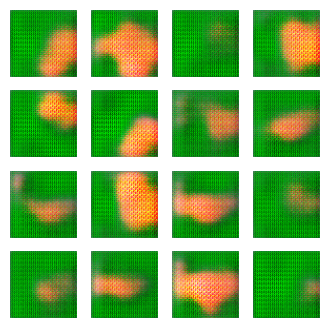

Epoch 8, Gen Loss: 3.0837, Disc Loss: 0.9092, Time: 1.92 sec


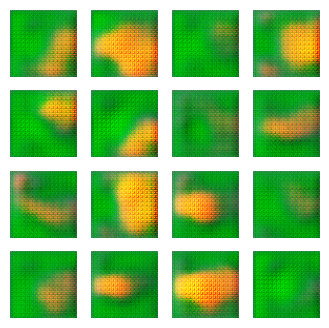

Epoch 9, Gen Loss: 1.8319, Disc Loss: 0.5210, Time: 1.91 sec


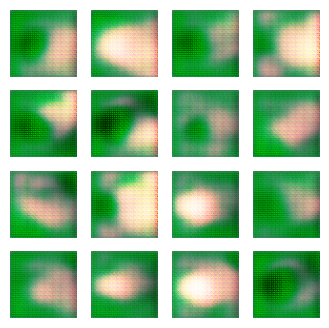

Epoch 10, Gen Loss: 2.0665, Disc Loss: 0.6312, Time: 1.90 sec


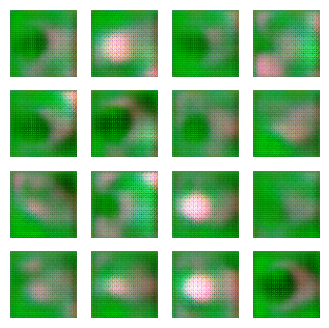

Epoch 11, Gen Loss: 1.4494, Disc Loss: 1.1589, Time: 1.89 sec


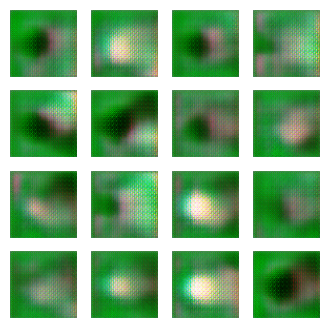

Epoch 12, Gen Loss: 1.9592, Disc Loss: 0.6717, Time: 1.93 sec


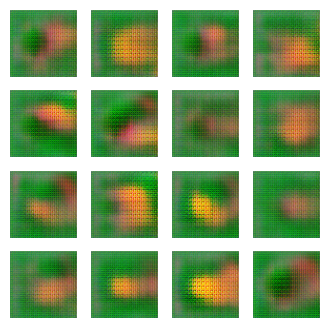

Epoch 13, Gen Loss: 1.3901, Disc Loss: 0.8574, Time: 1.88 sec


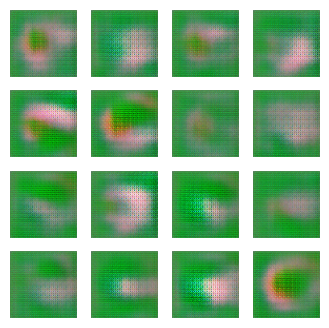

Epoch 14, Gen Loss: 1.0860, Disc Loss: 1.3196, Time: 1.87 sec


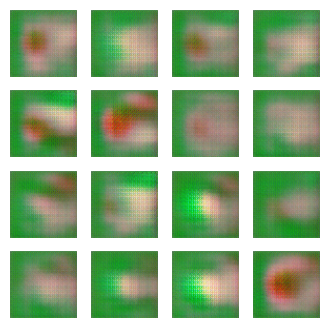

Epoch 15, Gen Loss: 1.2797, Disc Loss: 1.4605, Time: 1.87 sec


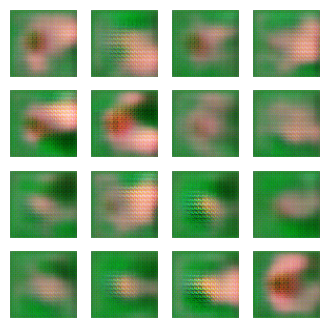

Epoch 16, Gen Loss: 2.7503, Disc Loss: 0.3489, Time: 1.86 sec


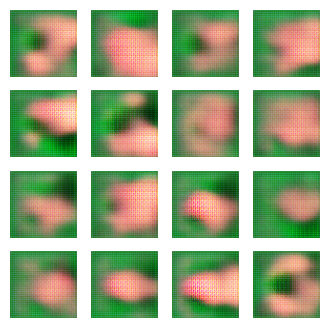

Epoch 17, Gen Loss: 2.7859, Disc Loss: 0.2410, Time: 1.85 sec


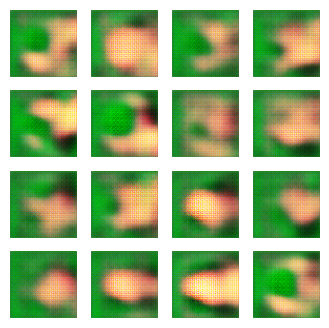

Epoch 18, Gen Loss: 1.8132, Disc Loss: 0.8896, Time: 1.85 sec


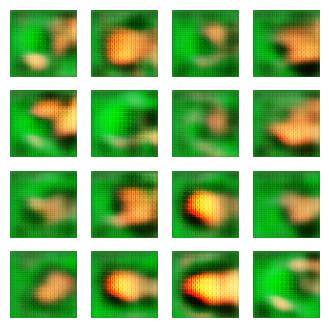

Epoch 19, Gen Loss: 2.6688, Disc Loss: 0.5904, Time: 1.84 sec


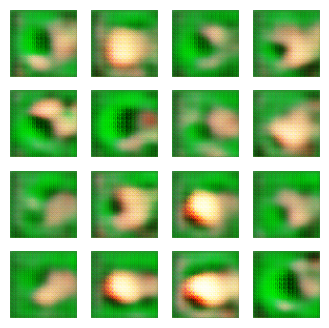

Epoch 20, Gen Loss: 2.1983, Disc Loss: 0.7145, Time: 1.84 sec


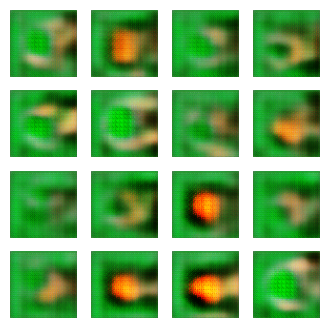

Epoch 21, Gen Loss: 1.5091, Disc Loss: 1.2195, Time: 1.85 sec


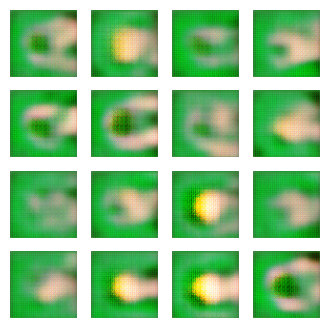

Epoch 22, Gen Loss: 2.4758, Disc Loss: 0.3957, Time: 1.84 sec


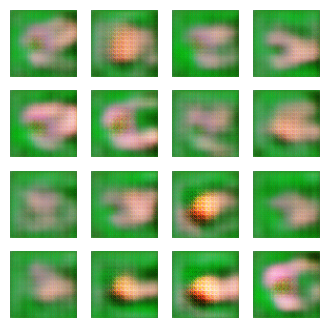

Epoch 23, Gen Loss: 1.7002, Disc Loss: 0.4944, Time: 1.85 sec


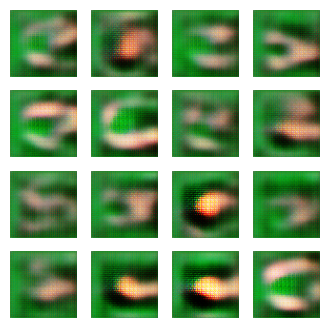

Epoch 24, Gen Loss: 1.5148, Disc Loss: 0.8161, Time: 1.84 sec


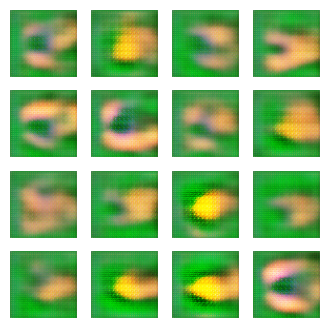

Epoch 25, Gen Loss: 1.7568, Disc Loss: 0.4416, Time: 1.85 sec


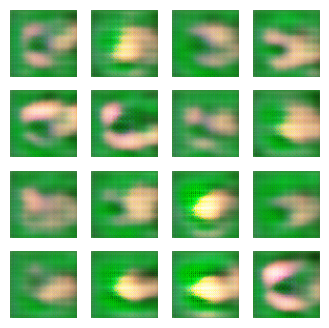

Epoch 26, Gen Loss: 1.5153, Disc Loss: 0.6847, Time: 1.84 sec


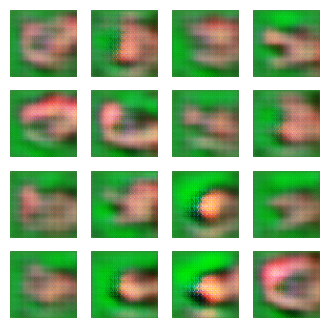

Epoch 27, Gen Loss: 1.0480, Disc Loss: 1.0230, Time: 1.84 sec


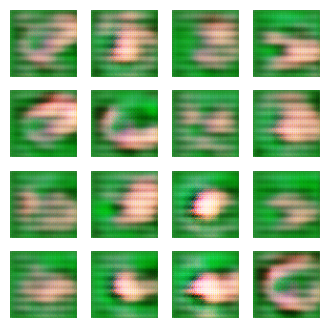

Epoch 28, Gen Loss: 1.4551, Disc Loss: 0.7164, Time: 1.85 sec


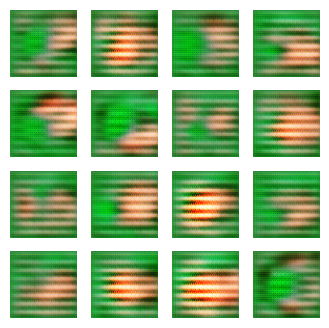

Epoch 29, Gen Loss: 1.4485, Disc Loss: 1.0541, Time: 1.85 sec


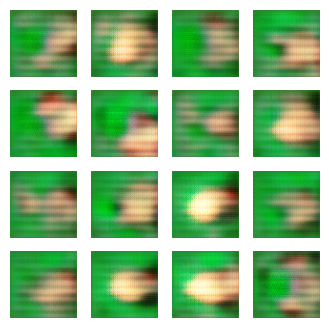

Epoch 30, Gen Loss: 1.1563, Disc Loss: 1.0750, Time: 1.86 sec


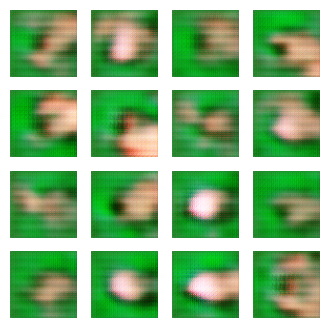

Epoch 31, Gen Loss: 1.1433, Disc Loss: 1.0105, Time: 1.89 sec


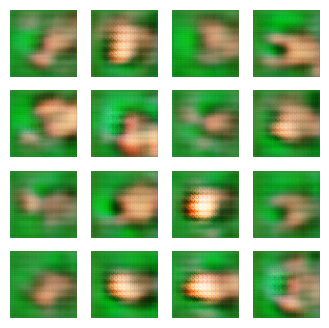

Epoch 32, Gen Loss: 2.1243, Disc Loss: 0.3849, Time: 1.87 sec


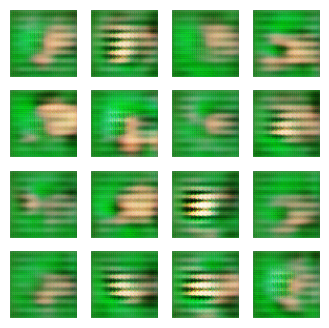

Epoch 33, Gen Loss: 2.9279, Disc Loss: 0.2470, Time: 1.92 sec


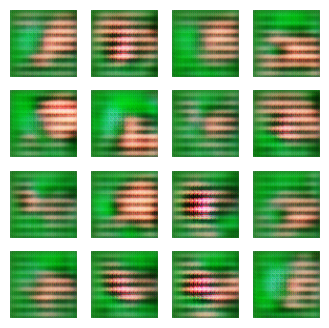

Epoch 34, Gen Loss: 1.1334, Disc Loss: 1.5377, Time: 1.86 sec


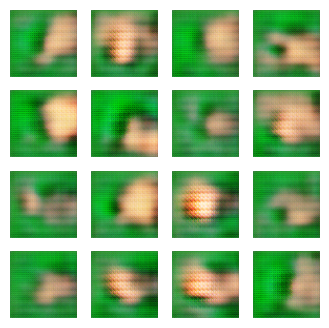

Epoch 35, Gen Loss: 1.4642, Disc Loss: 0.6112, Time: 1.86 sec


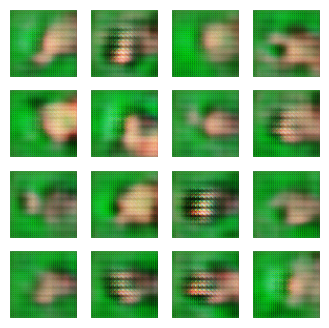

Epoch 36, Gen Loss: 1.9484, Disc Loss: 0.4093, Time: 1.88 sec


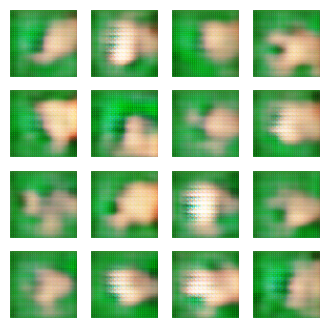

Epoch 37, Gen Loss: 2.9010, Disc Loss: 0.7873, Time: 1.88 sec


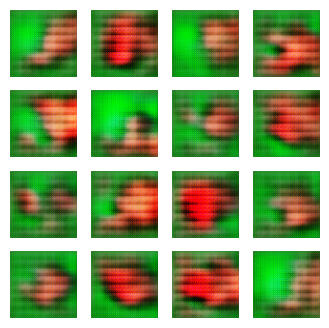

Epoch 38, Gen Loss: 0.8254, Disc Loss: 1.0220, Time: 1.88 sec


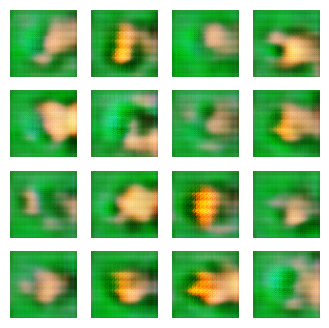

Epoch 39, Gen Loss: 1.2340, Disc Loss: 1.0427, Time: 1.92 sec


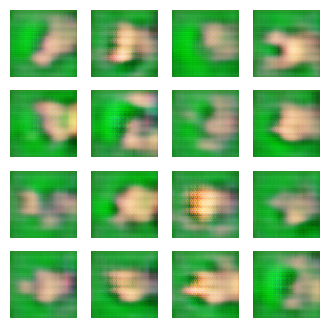

Epoch 40, Gen Loss: 1.1055, Disc Loss: 0.7885, Time: 1.87 sec


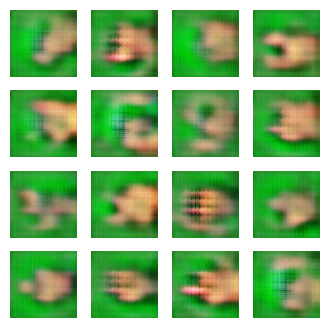

Epoch 41, Gen Loss: 1.6198, Disc Loss: 0.7462, Time: 1.88 sec


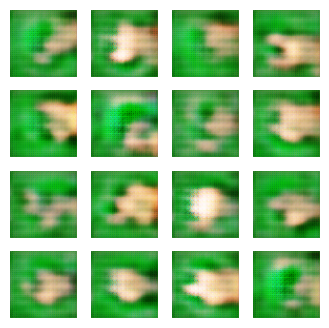

Epoch 42, Gen Loss: 2.1686, Disc Loss: 0.4282, Time: 1.88 sec


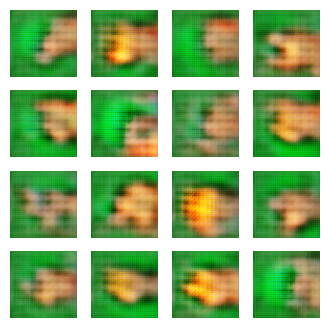

Epoch 43, Gen Loss: 1.5807, Disc Loss: 0.8265, Time: 1.88 sec


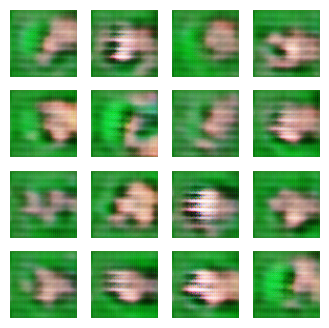

Epoch 44, Gen Loss: 1.7426, Disc Loss: 0.8937, Time: 1.90 sec


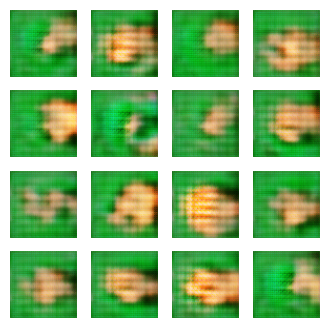

Epoch 45, Gen Loss: 1.9781, Disc Loss: 0.6567, Time: 1.88 sec


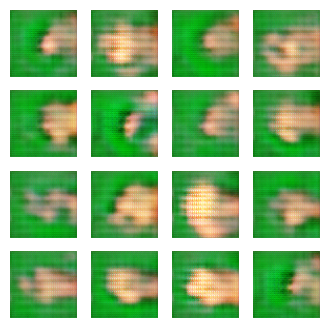

Epoch 46, Gen Loss: 1.5667, Disc Loss: 0.9343, Time: 1.87 sec


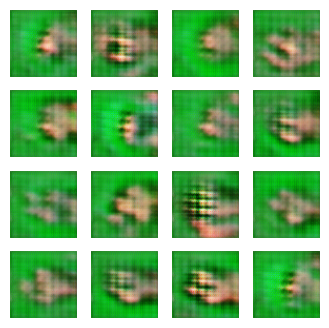

Epoch 47, Gen Loss: 1.5589, Disc Loss: 1.0178, Time: 1.89 sec


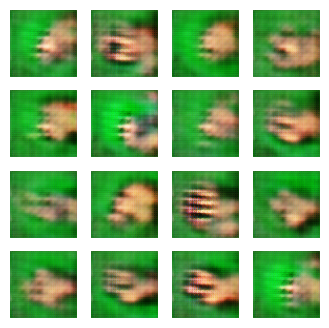

Epoch 48, Gen Loss: 1.2202, Disc Loss: 1.0053, Time: 1.87 sec


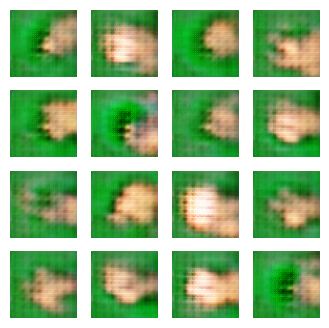

Epoch 49, Gen Loss: 1.1444, Disc Loss: 0.7859, Time: 1.88 sec


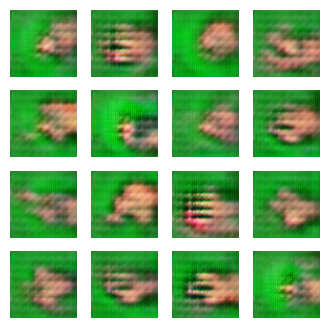

Epoch 50, Gen Loss: 1.7850, Disc Loss: 0.8146, Time: 1.91 sec


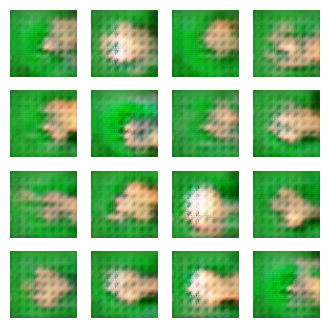

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
import time

# -------------------------
# Parameters & Dataset Setup
# -------------------------
BUFFER_SIZE = 1000
BATCH_SIZE = 32
IMG_SIZE = (64, 64)
EPOCHS = 50
noise_dim = 100        # Dimension of the noise vector for the generator
num_examples_to_generate = 16

# Path to my dataset folder on Google Drive
dataset_path = '/content/drive/MyDrive/rps-cv-images'

# Load the dataset from directory
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    label_mode=None,       # We don't need labels for GAN training
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=123
)

# Preprocess images: Convert pixel values from [0, 255] to [-1, 1]
def preprocess_image(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1.0
    return image

train_dataset = train_dataset.map(lambda x: preprocess_image(x))
train_dataset = train_dataset.cache().shuffle(BUFFER_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)

# -------------------------
# Define the Generator Model
# -------------------------
def make_generator_model():
    model = tf.keras.Sequential()
    # Dense layer to project noise vector and reshape to a low-res activation map
    model.add(tf.keras.layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(noise_dim,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Reshape((8, 8, 256)))  # Shape: (8, 8, 256)

    # Upsample to 16x16
    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    # Upsample to 32x32
    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    # Upsample to 64x64 and produce the final image with 3 channels; use tanh activation to get output in [-1, 1]
    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

generator = make_generator_model()
generator.summary()

# -------------------------
# Define the Discriminator Model
# -------------------------
def make_discriminator_model():
    model = tf.keras.Sequential()
    # Input shape is 64x64x3
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))  # Output a single scalar (real/fake score)
    return model

discriminator = make_discriminator_model()
discriminator.summary()

# -------------------------
# Define Loss Functions & Optimizers
# -------------------------
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    # Compare real images to label 1 and fake images to label 0
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    # Generator tries to fool the discriminator, so its loss is computed against labels of 1.
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# -------------------------
# Checkpointing
# -------------------------
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# -------------------------
# Training Functions
# -------------------------
# Seed for generating images to monitor progress
seed = tf.random.normal([num_examples_to_generate, noise_dim])

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

def generate_and_save_images(model, epoch, test_input):
    # Generate images and scale them back from [-1, 1] to [0, 1] for display.
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] + 1) / 2)
        plt.axis('off')
    plt.show()

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
        print(f'Epoch {epoch+1}, Gen Loss: {gen_loss:.4f}, Disc Loss: {disc_loss:.4f}, Time: {time.time()-start:.2f} sec')

        # Generate and display images after each epoch
        generate_and_save_images(generator, epoch + 1, seed)
        # Save the model every epoch
        checkpoint.save(file_prefix=checkpoint_prefix)

# -------------------------
# Run the Training Loop
# -------------------------
train(train_dataset, EPOCHS)

It is common to observe that a VAE generates more coherent and recognizable images compared to a basic GAN, particularly when the GAN’s training is unstable or its hyperparameters are not optimally tuned. Although GANs have the potential to produce sharper images, they require very careful configuration—such as a well-designed discriminator and precise learning rate adjustments—to prevent issues like mode collapse or noisy outputs. Therefore, if in this task the VAE delivers better-looking reconstructions while the GAN struggles, it is entirely logical; GANs are inherently more sensitive during training and often need additional tuning or advanced techniques (such as enhanced regularization, alternative loss functions, or more robust optimizers) to achieve performance comparable to that of a VAE.